In [ ]:
# import các thư viện

import os
import cv2
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout, GlobalAveragePooling2D

In [ ]:
# Các biến toàn cục

#Các biến dùng để cấu hình cho visualize data
NumImgsPerRow = 5 # Ứng với mỗi class sẽ xuất trên 1 hàng, mỗi hàng 5 ảnh
ImgHeight, ImgWidth = 10, 20 # Giới hạn chiều dài, chiều rộng của ảnh khi plot
figsize_per_image = (ImgHeight, ImgWidth)

num_classes = 5 # Khởi tạo số class là 5 class ứng với 5 hãng xe máy
batch_size = 128 # Khởi tạo batch size để tạo generator, training và evaluation

image_size = 224 # Khởi tạo kích thước ảnh đầu vào cho MobileNetV2
img_height, img_width = image_size, image_size

# Ánh xạ các số nguyên tương ứng với 1 hãng xe máy
classes = {
    0: 'Others',
    1: 'Honda',
    2: 'Suzuki',
    3: 'Yamaha',
    4: 'VinFast'
}

# thư mục gốc chứa thư mục dữ liệu
szWorkingDir = "/content/drive/MyDrive/Public"

# Split hiện tại mà code đang muốn thao tác
curSplit = 5

# Tên file csv ghi đường dẫn của các ảnh xe máy
szTrainFileName = "MotocycleDataset-Splits-{}-Train.csv".format(curSplit)
szTestFileName = "MotocycleDataset-Splits-{}-Test.csv".format(curSplit)

In [ ]:
#Đọc file csv để lấy đường dẫn của ảnh
df_train = pd.read_csv(os.path.join(szWorkingDir, szTrainFileName), header = None, names=['file_path', 'categoryID'])
df_test = pd.read_csv(os.path.join(szWorkingDir, szTestFileName), header = None, names=['file_path', 'categoryID'])

# Hàm lọc bỏ các ảnh bị lỗi đường dẫn, bị xóa, hoặc không tồn tại
def filter_invalid_images(df):
    valid_rows = []
    for index, row in df.iterrows():
        img_path = row['file_path']
        full_path = os.path.join(szWorkingDir, img_path)
        if os.path.exists(full_path):
            valid_rows.append(row)
    return pd.DataFrame(valid_rows)

# Tiến hành lọc các đường dẫn không xác định
# df_train = filter_invalid_images(df_train)
# df_test = filter_invalid_images(df_test)

In [ ]:
# Hàm dùng để đọc các ảnh từ đường dẫn của file csv, resize lại và lưu dưới định dạng npz
# Mục đích là để giảm thời gian truy xuất, đọc và xử lý dữ liệu sau này
# Hỗ trợ tạo generator để giảm tình trạng tiêu tốn ram
def load_and_process_images(df, image_size, file_name):
    images = []
    labels = []
    for idx, row in df.iterrows():
        img_path = os.path.join(szWorkingDir, 'data', row['file_path'])
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        if img is not None:
            resized_img = cv2.resize(img, (image_size, image_size))
            images.append(resized_img)
            labels.append(row['categoryID'])
    images = np.array(images)
    labels = np.array(labels)
    np.savez(file_name, images=images, labels=labels)

# Đường dẫn lưu file train, test
train_file = 'train_images_{}.npz'.format(curSplit)
test_file = 'test_images_{}.npz'.format(curSplit)

# Tiến hành đọc và lưu dữ liệu
load_and_process_images(df_train, image_size, train_file)
load_and_process_images(df_test, image_size, test_file)

In [ ]:
# Hàm dùng để đọc các ảnh đã lưu từ file npz, nhưng dùng generator để lưu trữ để tối ưu bộ nhớ và ram
def npz_generator(file_name, batch_size, num_classes, shuffle = True):
    # Đọc dữ liệu từ file npz
    data = np.load(file_name)
    images = data['images']
    labels = data['labels']
    data.close()

    num_samples = len(images) # Số lượng ảnh

    while True:
        if shuffle: # Nếu shuffle bằng True thì ta sẽ shuffle ngẫu nhiên dữ liệu lên để đảm bảo tính ngẫu nhiên của dữ liệu
          indices = np.arange(num_samples)
          np.random.shuffle(indices) # Tạo ra dãy các con số ngẫu nhiên trong khoảng từ 0 -> số lượng ảnh với thứ tự ngẫu nhiên và không trùng lặp

          for offset in range(0, num_samples, batch_size):
              batch_indices = indices[offset:offset + batch_size] # Khởi tạo dãy vị trí các ảnh được chọn ngẫu nhiên
              batch_images = images[batch_indices] / 255.0 # Lấy các ảnh ở vị trí được khởi tạo và chuẩn hóa bằng cách chia 255.0, đưa về miền [0, 1]
              batch_labels = labels[batch_indices] # Lấy ra các lấy labels với vị trí tương ứng với các ảnh
              batch_labels = to_categorical(batch_labels, num_classes) # Chuẩn hóa labels thành dạng vector one hot để đưa vào huấn luyện trong mô hình
              yield batch_images, batch_labels # Trả về các lô ảnh lần lượt như một generator

        else: # Nếu shuffle bằng False thì lấy dữ liệu ra với vị trí ban đầu

          for offset in range(0, num_samples, batch_size):
              batch_images = images[offset:offset + batch_size] / 255.0
              batch_labels = labels[offset:offset + batch_size]
              batch_labels = to_categorical(batch_labels, num_classes)
              yield batch_images, batch_labels

train_file = 'train_images_{}.npz'.format(curSplit)
train_gen = npz_generator(train_file, batch_size, num_classes)

test_file = 'test_images_{}.npz'.format(curSplit)
test_gen = npz_generator(test_file, batch_size, num_classes)

In [ ]:
# Khởi tạo dictionary để ánh xạ ứng với hãng xe máy x ta xe có nhứng hình ảnh nào, ...
train_images = {}
test_images = {}

# Đổi cột categoryID thành str để tiện thao tác xuất
df_train['categoryID'] = df_train['categoryID'].astype(str)
df_test['categoryID'] = df_test['categoryID'].astype(str)

for Class in range(num_classes):
    for i in df_train[(df_train['categoryID'] == str(Class))].sample(n=NumImgsPerRow)['file_path']: # Chỉ chọn một vài ảnh ngẫu nhiên của mỗi hãng xe máy để đại diện
        img = cv2.imread(os.path.join(szWorkingDir, i), cv2.IMREAD_COLOR) # Đọc ảnh
        if img is not None:
            if Class not in train_images: # Khởi tạo hãng xe máy ban đầu là chưa có ảnh nào
                train_images[Class] = []
            train_images[Class].append(img) # Thêm ảnh vào hãng xe máy tương ứng với nó

# Chức năng tương tự như trên nhưng áp dụng cho tập test
for Class in range(num_classes):
    for i in df_test[(df_test['categoryID'] == str(Class))].sample(n=NumImgsPerRow)['file_path']:
        img = cv2.imread(os.path.join(szWorkingDir, i), cv2.IMREAD_COLOR)
        if img is not None:
            if Class not in test_images:
                test_images[Class] = []
            test_images[Class].append(img)

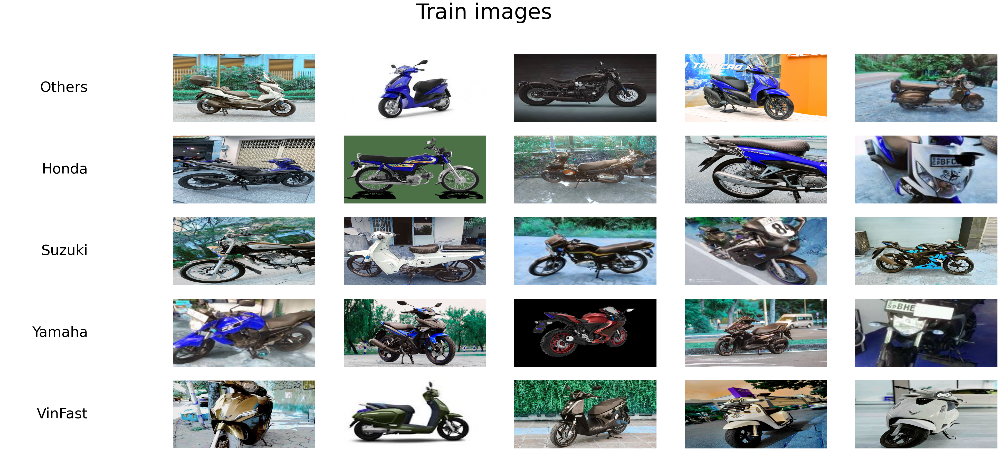

In [ ]:
# Khởi tạo kích thước, bố cục của các ảnh sẽ được xuất ra
figsize = (figsize_per_image[0] * NumImgsPerRow, figsize_per_image[1])

# tạo các subplot để xuất ảnh tương ứng với từng loại xe máy
fig, axes = plt.subplots(num_classes, NumImgsPerRow+1, figsize=figsize)

# Xuất các ảnh
for i, ax_row in enumerate(axes):
    for j, ax in enumerate(ax_row):
        ax.axis('off')
        if j == 0:
            ax.text(0.6, 0.5, f'{classes[i]}', va='center', ha='right', transform=ax.transAxes, fontsize=40) # Ghi ra tên của hãng xe máy tại vị trí đầu tiên của mỗi dòng
        else: # Ứng với mỗi hãng xe máy, xuất ra các ảnh tương ứng với hãng đó trên cùng một dòng
            img_index = j - 1
            if img_index < len(train_images[i]):
                ax.imshow(train_images[i][img_index], aspect='auto')
            else:
                ax.set_visible(False)

plt.suptitle('Train images', fontsize=60)
plt.show()

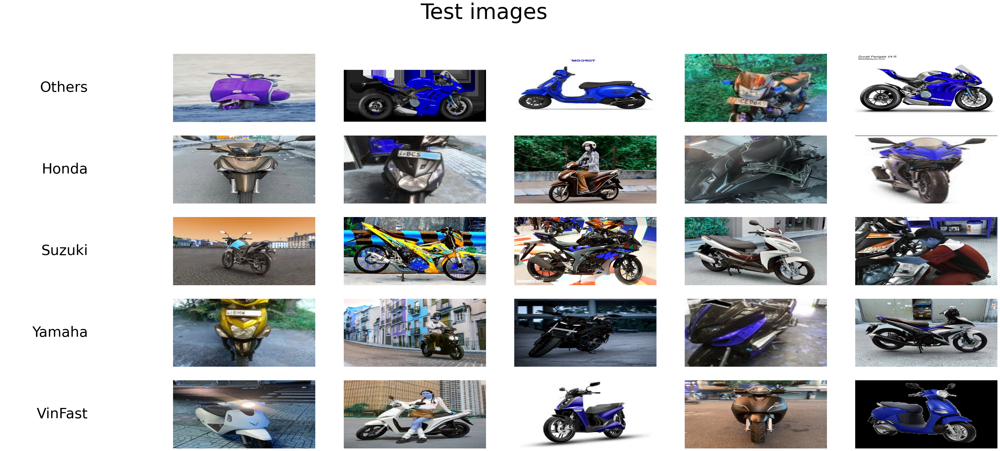

In [ ]:
# Chức năng tương tự cell trên nhưng áp dụng cho tập test
figsize = (figsize_per_image[0] * NumImgsPerRow, figsize_per_image[1])

fig, axes = plt.subplots(num_classes, NumImgsPerRow+1, figsize=figsize)

for i, ax_row in enumerate(axes):
    for j, ax in enumerate(ax_row):
        ax.axis('off')
        if j == 0:
            ax.text(0.6, 0.5, f'{classes[i]}', va='center', ha='right', transform=ax.transAxes, fontsize=40)
        else:
            img_index = j - 1
            if img_index < len(test_images[i]):
                ax.imshow(test_images[i][img_index], aspect='auto')
            else:
                ax.set_visible(False)

plt.suptitle('Test images', fontsize=60)
plt.show()

In [ ]:
# Sử dụng ImageDataGenerator của keras để tăng cường dữ liệu
# Tạo một đối tượng ImageDataGenerator với các tham số tăng cường dữ liệu
datagen = ImageDataGenerator(
    rotation_range=40,        # Phạm vi xoay ngẫu nhiên của hình ảnh (tối đa 40 độ)
    width_shift_range=0.3,    # Phạm vi dịch chuyển ngang ngẫu nhiên của hình ảnh (tối đa 30% chiều rộng)
    height_shift_range=0.3,   # Phạm vi dịch chuyển dọc ngẫu nhiên của hình ảnh (tối đa 30% chiều cao)
    shear_range=0.3,          # Phạm vi biến đổi cắt xén ngẫu nhiên của hình ảnh (tối đa 30%)
    zoom_range=0.3,           # Phạm vi thu phóng ngẫu nhiên của hình ảnh (tối đa 30%)
    horizontal_flip=True,     # Lật ngang ngẫu nhiên hình ảnh
)

In [ ]:
# Hàm để tăng cường dữ liệu cho ảnh bằng ImageDataGenerator thông qua generator data từ file npz chúng ta đã đọc
def combined_generator(generator, datagen, augment=False):
    while True:
        batch_images, batch_labels = next(generator) # lấy ra lô hình ảnh đã được chia sẵn theo thứ tự
        if augment: # Nếu augment bằng True thì mới tiến hành tăng cường dữ liệu cho ảnh, thường chỉ tăng cường cho tập train
            augmented_images = datagen.flow(batch_images, batch_size=len(batch_images), shuffle=False).next()
            yield augmented_images, batch_labels # Trả về các lô ảnh dã được tăng cường lần lượt như một generator
        else:
            yield batch_images, batch_labels # Trả về các lô ảnh lần lượt như một generator

In [ ]:
train_gen = combined_generator(train_gen, datagen, augment=True)

In [ ]:
# Xử dụng pretrained model là MobileNetV2 từ keras để làm feature extractrion với đầu vào của ảnh là 224, 224, 3
# Include_top = False để chỉ lấy phần trích xuất đặc trưng còn phần NN ta sẽ chỉnh sửa và train lại cho phù hợp với yêu cầu bài toán nhận diện xe máy
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

# Tận dụng pretrained model để trích xuát, đồng thời để giảm thời gian training mà vẫn đạt kết quả cao
# Ta khởi tạo trainable cho MobileNetV2 là False để khi train thì ko cập nhật tham số cho mô hình này
base_model.trainable = False

In [ ]:
# Khởi tạo model Sequential
model = Sequential()

# Thêm base model là MobileNetV2, bỏ qua lớp đầu ra trên cùng và chỉ sử dụng các lớp convolutional đã được huấn luyện trước đó
# base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model.add(base_model)

# Thêm lớp GlobalAveragePooling2D để chuyển đổi các đặc trưng từ base model thành một vector duy nhất
model.add(GlobalAveragePooling2D())

model.add(Dense(1024, activation='relu')) # Thêm lớp Dense với 1024 nút và hàm kích hoạt ReLU để học các đặc trưng phi tuyến tính
model.add(BatchNormalization()) # Thêm lớp BatchNormalization để chuẩn hóa output của lớp Dense trước đó, giúp tăng tốc quá trình huấn luyện và ổn định mô hình
model.add(Dropout(0.25)) # Thêm lớp Dropout với tỷ lệ 0.25 để giảm thiểu overfitting bằng cách ngẫu nhiên bỏ qua 25% các nút trong quá trình huấn luyện

# các block code sau có chức năng tương ứng block code trên
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Dense(32, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Dense(16, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))

# Thêm lớp đầu ra với số lượng nút tương ứng với số lớp (classes) và hàm kích hoạt softmax để dự đoán xác suất của từng lớp
model.add(Dense(num_classes, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_8  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_64 (Dense)            (None, 1024)              1311744   
                                                                 
 batch_normalization_56 (Ba  (None, 1024)              4096      
 tchNormalization)                                               
                                                                 
 dropout_56 (Dropout)        (None, 1024)              0         
                                                      

### Bước 5 - Model Training

- Nên có visualize model accuracy, model loss để xem các hyperparameters có cần điều chỉnh không

In [ ]:
# Đường dẫn lưu trữ mô hình, với tên file được định dạng dựa trên giá trị của biến curSplit
checkpoint_path = '/content/drive/MyDrive/splits_{}.h5'.format(curSplit)

# Tạo callback ModelCheckpoint để lưu trữ mô hình
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,          # Đường dẫn lưu trữ file mô hình
    save_weights_only=False,           # Lưu cả kiến trúc mô hình và trọng số, không chỉ riêng trọng số
    monitor='val_accuracy',            # Giám sát chỉ số 'val_accuracy' (độ chính xác trên tập xác thực)
    mode='max',                        # Lưu mô hình khi 'val_accuracy' đạt giá trị cao nhất (max)
    save_best_only=True,               # Chỉ lưu mô hình khi nó là tốt nhất (dựa trên 'val_accuracy')
    save_freq='epoch'                  # Lưu mô hình sau mỗi epoch
)

In [ ]:
# Nếu đã có file model đã train từ trước và muốn dùng để train tiếp thì có thể load lại
model = load_model('splits_{}.h5'.format(curSplit))

In [ ]:
# Có thể điều chỉnh dropout rate của các layer cho phù hợp với tình hình training
for layer in model.layers:
    if isinstance(layer, Dropout):
        layer.rate = 0.0

In [ ]:
# Compile model với optimizer là 'adam', hàm mất mát là 'categorical_crossentropy' và độ đo là 'accuracy'
model.compile(
    optimizer='adam',                        # Thuật toán tối ưu hóa Adam để cập nhật trọng số mô hình
    loss='categorical_crossentropy',         # Hàm mất mát dành cho bài toán phân loại nhiều lớp
    metrics=['accuracy']                     # Độ đo để đánh giá hiệu suất mô hình trong quá trình huấn luyện
)

In [ ]:
# Huấn luyện mô hình với dữ liệu từ generator train_gen và validation từ generator test_gen

history = model.fit(
    train_gen,                              # Dữ liệu huấn luyện từ generator
    epochs=3,                               # Số lượng epochs (vòng lặp) huấn luyện
    validation_data=test_gen,               # Dữ liệu validation từ generator
    steps_per_epoch= (train_size // batch_size) + 1,   # Số lượng bước (steps) mỗi epoch
    validation_steps= (test_size // batch_size) + 1,   # Số lượng bước validation mỗi epoch
    # callbacks=[checkpoint_callback],        # Danh sách các callbacks được áp dụng trong quá trình huấn luyện
    verbose=1,                               # Cấp độ hiển thị thông tin trong quá trình huấn luyện (1: hiển thị chi tiết, 0: không hiển thị)
)


Epoch 1/3
50/50 [==============================] - 117s 2s/step - loss: 0.7700 - accuracy: 0.7053 - val_loss: 0.5922 - val_accuracy: 0.7688
Epoch 2/3
50/50 [==============================] - 96s 2s/step - loss: 0.7733 - accuracy: 0.7033 - val_loss: 0.6292 - val_accuracy: 0.7621
Epoch 3/3
50/50 [==============================] - 97s 2s/step - loss: 0.7547 - accuracy: 0.7166 - val_loss: 0.5996 - val_accuracy: 0.7676


In [ ]:
# Lấy các giá trị loss và accuracy từ history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Biểu đồ loss
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(val_loss, label='Validation Loss', color='red', marker='o')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Biểu đồ accuracy
plt.figure(figsize=(10, 5))
plt.plot(train_acc, label='Training Accuracy', color='blue', marker='o')
plt.plot(val_acc, label='Validation Accuracy', color='red', marker='o')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
test_file = 'test_images_{}.npz'.format(curSplit)

model = load_model('splits_{}.h5'.format(curSplit))

In [ ]:
# Tạo generator từ file test để đánh giá mô hình
test_gen = npz_generator(test_file, batch_size, num_classes, shuffle=False)

# Đánh giá mô hình trên dữ liệu test và lấy kết quả loss và accuracy
loss, accuracy = model.evaluate(
    test_gen,                                       # Generator chứa dữ liệu test
    steps= len(df_test)// batch_size,              # Số lượng bước (steps) đánh giá
    verbose=1                                       # Cấp độ hiển thị thông tin (1: hiển thị chi tiết, 0: không hiển thị)
)

# In ra kết quả loss và accuracy trên dữ liệu test
print(f'Loss : {loss}, Test Accuracy: {accuracy}')


54/54 [==============================] - 17s 223ms/step - loss: 0.5743 - accuracy: 0.7839
Loss : 0.5743113160133362, Test Accuracy: 0.7839343547821045


In [ ]:
# Đọc dữ liệu từ file test
data = np.load(test_file)
y_true = data['labels']        # Nhãn thực tế từ dữ liệu
y_true = y_true.astype(int)    # Chuyển đổi về kiểu integer (nếu cần thiết)
data.close()

# Tạo generator từ file test để đưa vào mô hình dự đoán
test_gen = npz_generator(test_file, batch_size, num_classes, shuffle=False)

# Dự đoán với mô hình trên dữ liệu test
y_pred = model.predict(
    test_gen,                           # Generator chứa dữ liệu test
    steps=(len(y_true)// batch_size) + 1,    # Số lượng bước (steps) dự đoán
    verbose=1                           # Cấp độ hiển thị thông tin (1: hiển thị chi tiết, 0: không hiển thị)
)

# Lấy chỉ số của lớp có xác suất cao nhất là dự đoán của mô hình
y_pred = np.argmax(y_pred, axis=1)

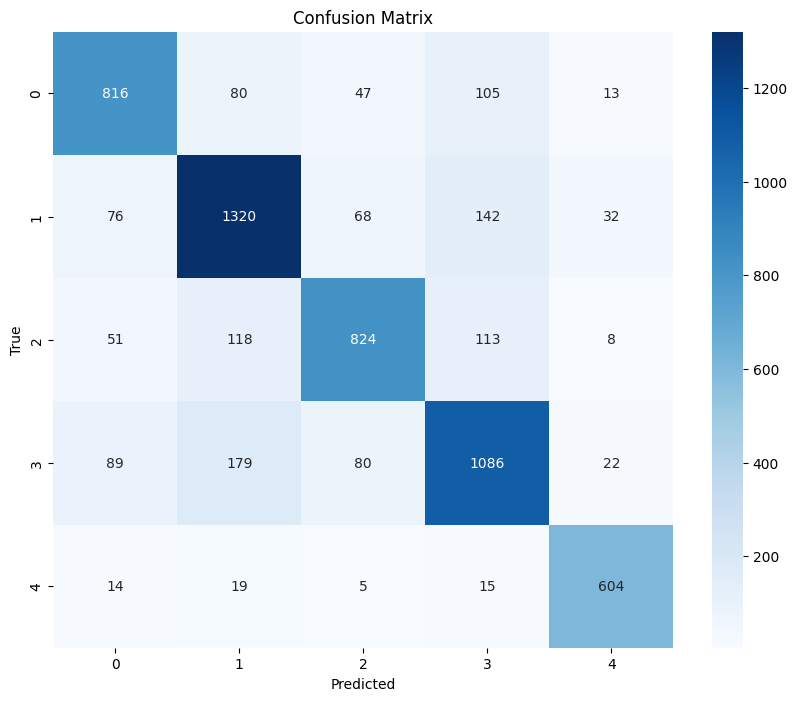

In [ ]:
# Tính toán confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Vẽ biểu đồ heatmap cho confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')

# Đặt tên cho trục x và y
plt.xlabel('Predicted')
plt.ylabel('True')

# Đặt tiêu đề cho biểu đồ
plt.title('Confusion Matrix')

# Hiển thị biểu đồ
plt.show()